# 1. Image wise Object detection

In [ ]:
import cv2
from yolo_predictions import YOLO_Pred

In [ ]:
yolo = YOLO_Pred(r"C:\SEM_3\prjt\yolo_object_detection\Notes\2_Predictions\Model-20241111T230622Z-001\Model\weights\best.onnx",'data.yaml')

In [ ]:
img = cv2.imread('./img1.jpg')

cv2.imshow('img',img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [26]:
# predictions
img_pred = yolo.predictions(img)

In [27]:
cv2.imshow('prediction image',img_pred)
cv2.waitKey(0)
cv2.destroyAllWindows()

# 2. Folder wise Object detection

In [12]:
import cv2
import os
from yolo_predictions import YOLO_Pred

# Initialize the YOLO model
yolo = YOLO_Pred(r"C:\SEM_3\prjt\yolo_object_detection\Notes\2_Predictions\Model-20241111T230622Z-001\Model\weights\best.onnx", 'data.yaml')

# Path to the test directory
test_dir = './test'

# Loop through each file in the test directory
for filename in os.listdir(test_dir):
    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Filter for image files
        img_path = os.path.join(test_dir, filename)
        
        # Load the image
        img = cv2.imread(img_path)
        
        # Make predictions
        img_pred = yolo.predictions(img)
        
        # Display the prediction
        cv2.imshow(f'Prediction - {filename}', img_pred)
        cv2.waitKey(0)  # Wait for a key press to proceed to the next image
        cv2.destroyAllWindows()
        
        # Display the original image (optional)
        cv2.imshow(f'Original - {filename}', img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()


# 3. In display Folder wise Object detection

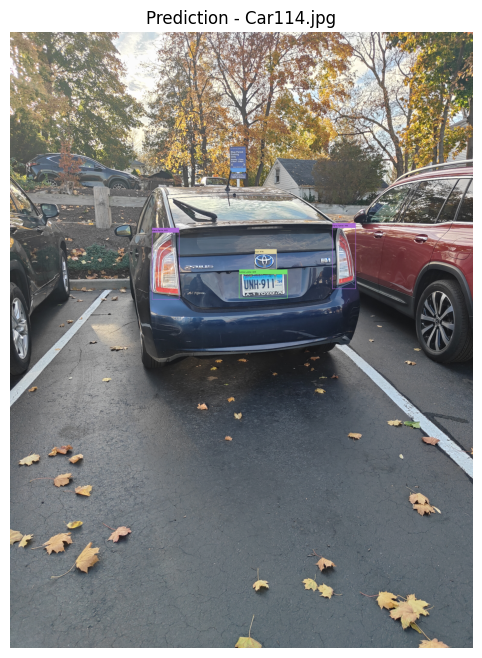

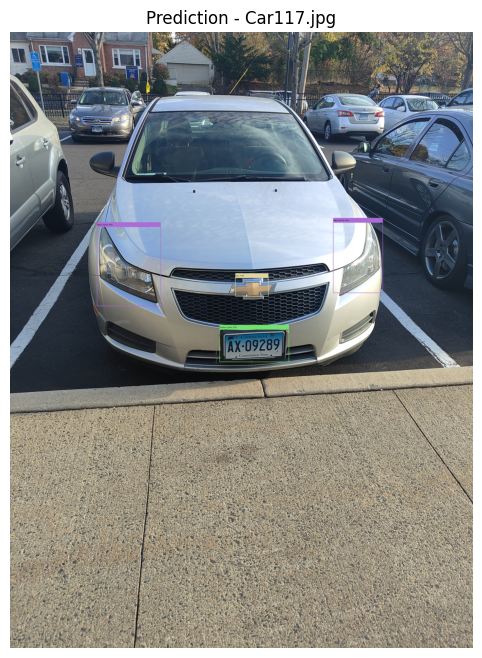

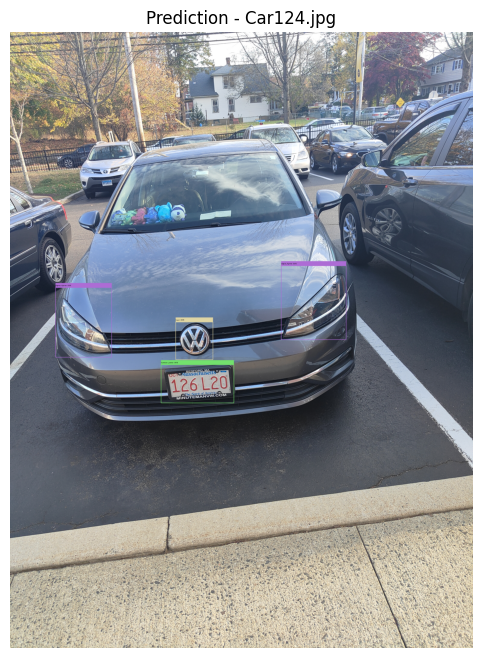

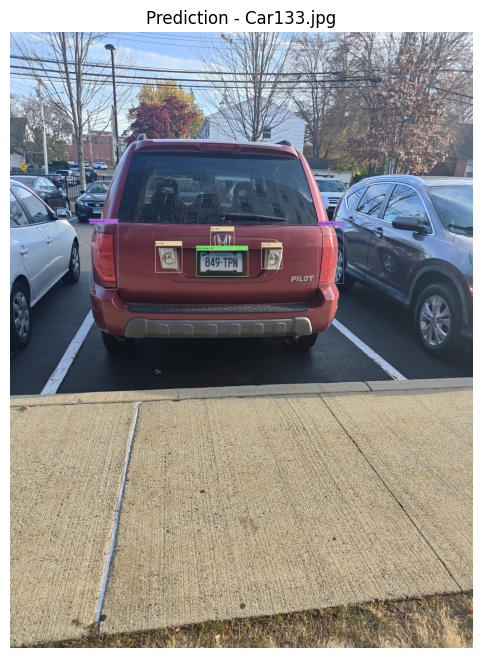

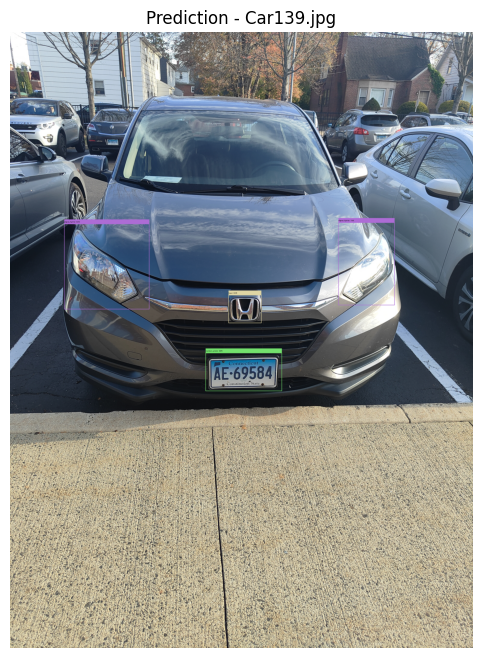

...

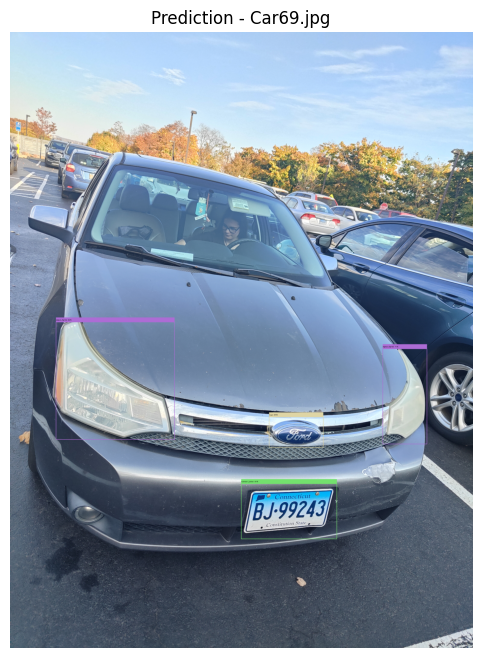

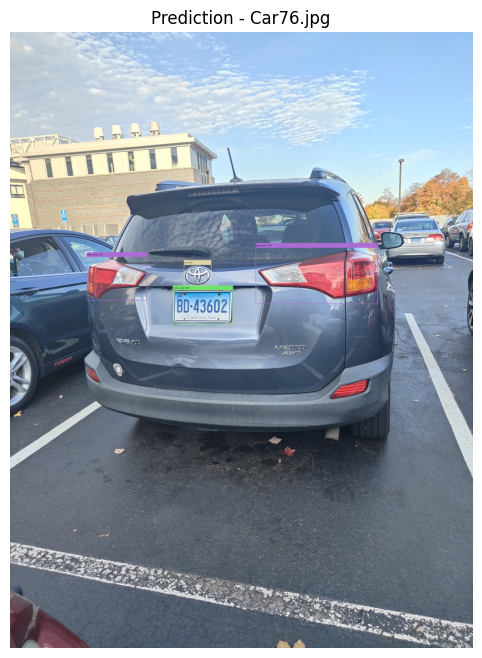

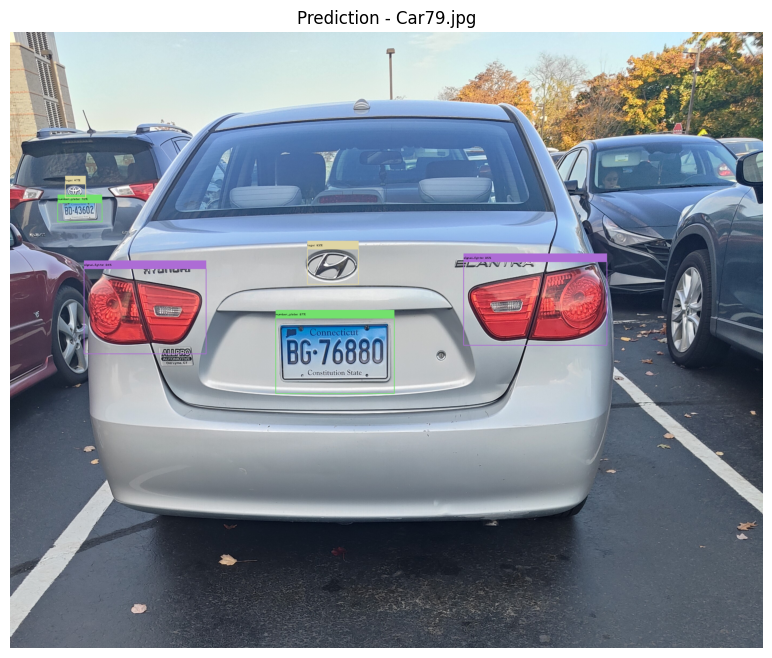

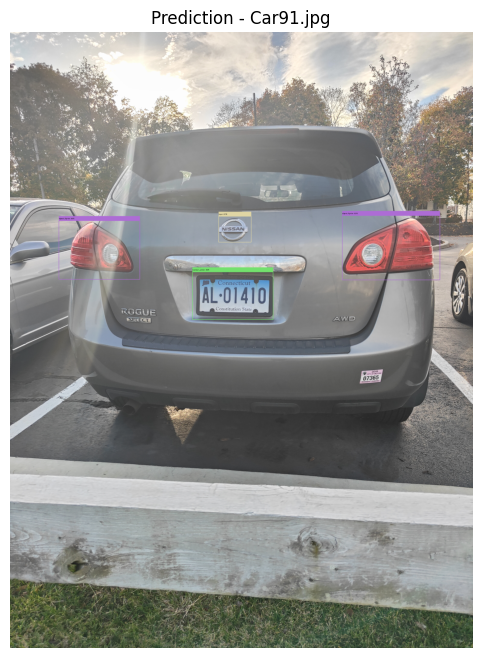

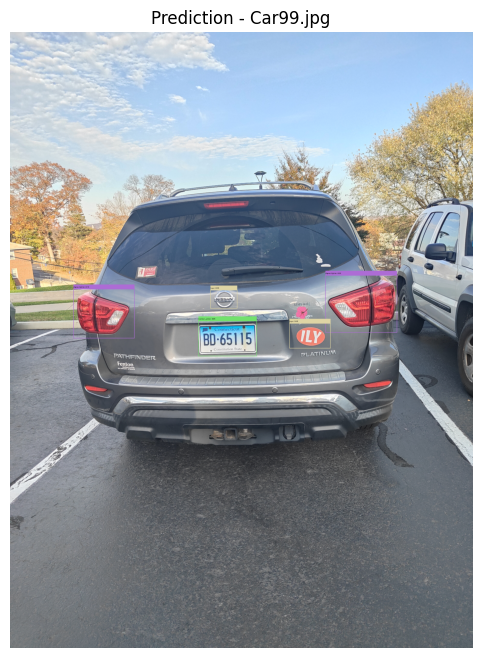

In [7]:
import cv2
import os
import matplotlib.pyplot as plt
from yolo_predictions import YOLO_Pred

# Initialize the YOLO model
yolo = YOLO_Pred(r"C:\SEM_3\prjt\yolo_object_detection\Notes\2_Predictions\Model-20241111T230622Z-001\Model\weights\best.onnx", 'data.yaml')

# Path to the test directory
test_dir = './test'

# Loop through each file in the test directory
for filename in os.listdir(test_dir):
    if filename.endswith(('.jpg', '.jpeg', '.png')):  # Filter for image files
        img_path = os.path.join(test_dir, filename)
        
        # Load the image
        img = cv2.imread(img_path)
        
        # Make predictions
        img_pred = yolo.predictions(img)
        
        # Resize the prediction image (scale down by 80% for higher quality)
        scale_percent = 80  # Adjust this percentage as needed
        width = int(img_pred.shape[1] * scale_percent / 100)
        height = int(img_pred.shape[0] * scale_percent / 100)
        dim = (width, height)
        
        # Resizing the image with less downscaling for better quality
        img_pred_resized = cv2.resize(img_pred, dim, interpolation=cv2.INTER_AREA)
        
        # Convert BGR to RGB for displaying with matplotlib
        img_pred_rgb = cv2.cvtColor(img_pred_resized, cv2.COLOR_BGR2RGB)
        
        # Display the prediction image using matplotlib
        plt.figure(figsize=(12, 8))  # Larger figure size for better clarity
        plt.imshow(img_pred_rgb)
        plt.axis('off')  # Hide axis
        plt.title(f'Prediction - {filename}')
        plt.show()


# 

# 4. Average loss for training and validation data and Visualization

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
results_path = r"C:\SEM_3\prjt\yolo_object_detection\Notes\2_Predictions\Model-20241111T230622Z-001\Model\results.csv"  # Replace with your file path
data = pd.read_csv(results_path)

# Display the first few rows to check the data structure
data.head()



Average Training Box Loss: 0.0645
Average Training Object Loss: 0.0386
Average Training Class Loss: 0.0121
Average Validation Box Loss: 0.0611
Average Validation Object Loss: 0.0265
Average Validation Class Loss: 0.0087


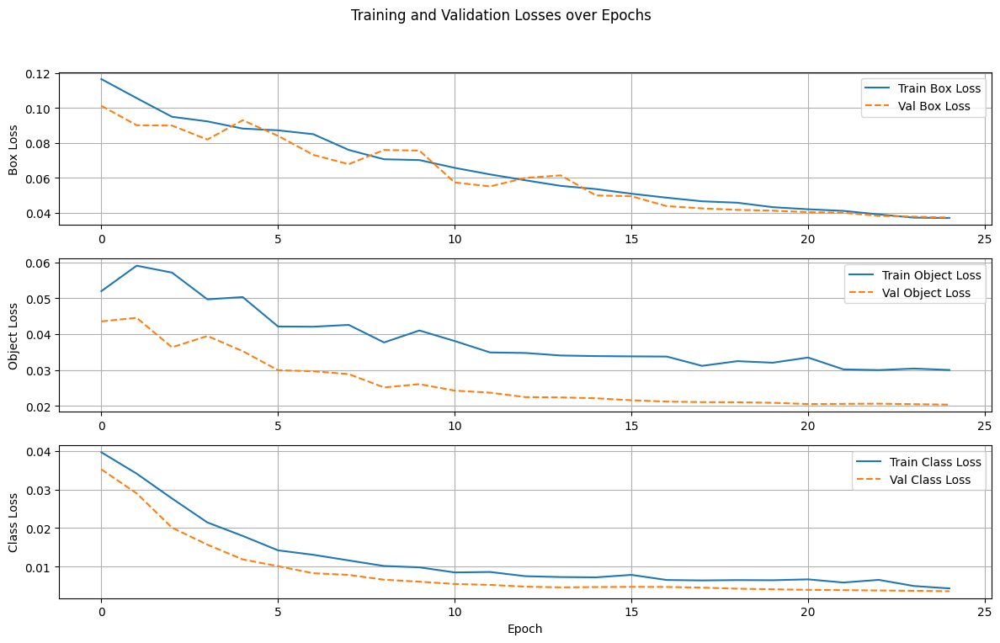

In [21]:
# Strip whitespace from headers
data.columns = data.columns.str.strip()

# Re-run the modified code
average_train_box_loss = data['train/box_loss'].mean()
average_train_obj_loss = data['train/obj_loss'].mean()
average_train_cls_loss = data['train/cls_loss'].mean()
average_val_box_loss = data['val/box_loss'].mean()
average_val_obj_loss = data['val/obj_loss'].mean()
average_val_cls_loss = data['val/cls_loss'].mean()

print(f"Average Training Box Loss: {average_train_box_loss:.4f}")
print(f"Average Training Object Loss: {average_train_obj_loss:.4f}")
print(f"Average Training Class Loss: {average_train_cls_loss:.4f}")
print(f"Average Validation Box Loss: {average_val_box_loss:.4f}")
print(f"Average Validation Object Loss: {average_val_obj_loss:.4f}")
print(f"Average Validation Class Loss: {average_val_cls_loss:.4f}")

# Plot training and validation losses over epochs
plt.figure(figsize=(12, 8))

# Plot box loss
plt.subplot(3, 1, 1)
plt.plot(data['epoch'], data['train/box_loss'], label='Train Box Loss')
plt.plot(data['epoch'], data['val/box_loss'], label='Val Box Loss', linestyle='--')
plt.ylabel('Box Loss')
plt.legend()
plt.grid(True)

# Plot object loss
plt.subplot(3, 1, 2)
plt.plot(data['epoch'], data['train/obj_loss'], label='Train Object Loss')
plt.plot(data['epoch'], data['val/obj_loss'], label='Val Object Loss', linestyle='--')
plt.ylabel('Object Loss')
plt.legend()
plt.grid(True)

# Plot class loss
plt.subplot(3, 1, 3)
plt.plot(data['epoch'], data['train/cls_loss'], label='Train Class Loss')
plt.plot(data['epoch'], data['val/cls_loss'], label='Val Class Loss', linestyle='--')
plt.xlabel('Epoch')
plt.ylabel('Class Loss')
plt.legend()
plt.grid(True)

plt.suptitle('Training and Validation Losses over Epochs')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# 5. Visualizing the 1st sample of each minibatch of size 8 and its prediction

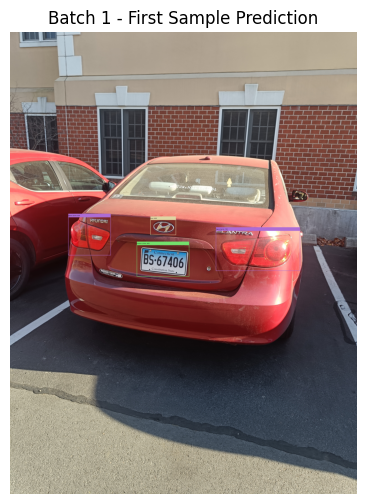

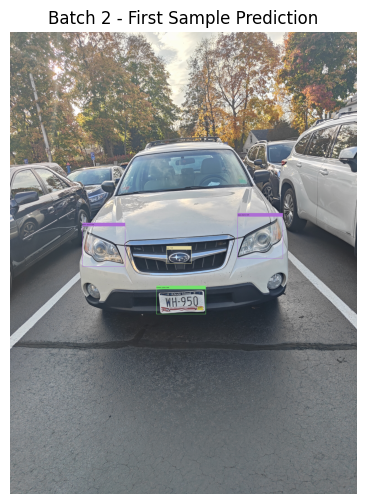

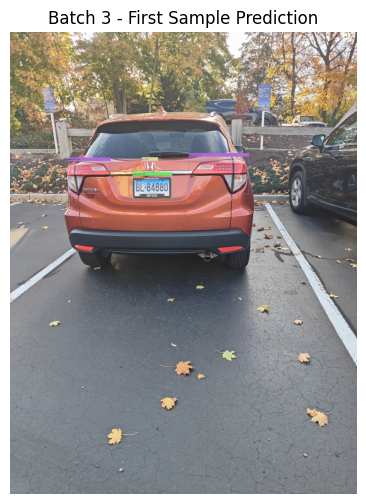

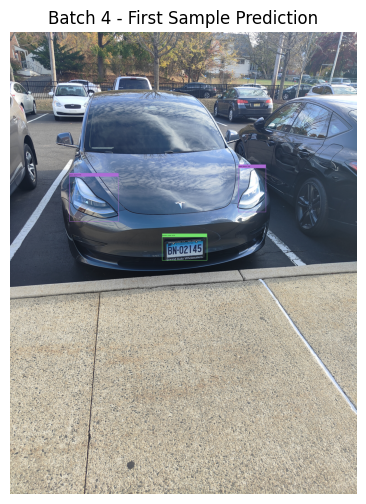

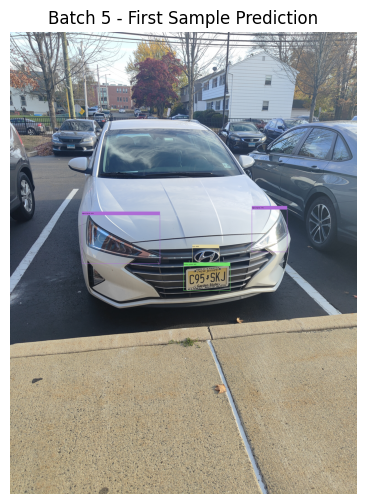

In [24]:
import os
import cv2
import matplotlib.pyplot as plt
from yolo_predictions import YOLO_Pred

# Initialize the YOLO model
yolo = YOLO_Pred(r"C:\SEM_3\prjt\yolo_object_detection\Notes\2_Predictions\Model-20241111T230622Z-001\Model\weights\best.onnx", 'data.yaml')

# Define your dataset path
image_dir = r"C:\SEM_3\prjt\yolo_object_detection\Notes\1_datapreparation\data_images\train"  # Path to your training images
batch_size = 8

# List all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Process images in minibatches of size 8
for i in range(0, len(image_files), batch_size):
    # Get the first image in the current minibatch
    first_image_path = os.path.join(image_dir, image_files[i])
    
    # Load the first image
    img = cv2.imread(first_image_path)
    
    # Perform prediction on the first image of the minibatch
    prediction = yolo.predictions(img)
    
    # Convert BGR to RGB for displaying with matplotlib
    prediction_rgb = cv2.cvtColor(prediction, cv2.COLOR_BGR2RGB)
    
    # Display the image with its prediction
    plt.figure(figsize=(6, 6))
    plt.imshow(prediction_rgb)
    plt.axis('off')
    plt.title(f'Batch {i//batch_size + 1} - First Sample Prediction')
    plt.show()

    # Optional: Stop after a few batches for demonstration purposes
    if i // batch_size == 4:  # Display only the first 5 minibatches
        break
